# Assignment Week 3 - "Large" Datasets and Data Augmentation

## Task 1

1. Download the ["Fast Food Classification Dataset - V2"](https://www.kaggle.com/datasets/utkarshsaxenadn/fast-food-classification-dataset/data) from Kaggle.

2. Unzip and ensure that the dataset in Colab is structured as follows:

```
|
|-- Fast Food Classification V2
|   |-- TFRecords
|   |-- Test
|   |-- Train
|   `-- Valid
|-- sample_data
`-- archive.zip
```

`Fast Food Classification V2` and `archive.zip` should be on the same level as the already existing `sample_data` directory from Colab. You can ignore the `TFRecords` subdirectory in the following tasks.

In [2]:
#!/bin/bash
!curl -L -o archive.zip https://www.kaggle.com/api/v1/datasets/download/utkarshsaxenadn/fast-food-classification-dataset

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  820M  100  820M    0     0  21.2M      0  0:00:38  0:00:38 --:--:-- 22.4M


In [3]:
!ls

archive.zip  sample_data


In [4]:
!unzip -q archive.zip

In [5]:
!ls 'Fast Food Classification V2'

Test  TFRecords  Train	Valid


In [6]:
!mv 'Fast Food Classification V2' fastfood

In [7]:
!ls

archive.zip  fastfood  sample_data


## Task 2

1. Define the directory paths for training, validation, and test datasets.

2. Apply the provided `delete_invalid_images` function to check and remove any corrupted or invalid images in each of the three dataset directories.

In [7]:
TRAINING_DIR = "fastfood/Train" # TODO: Add the training data directory path
VALIDATION_DIR = "fastfood/Valid" # TODO: Add the validation data directory path
TEST_DIR = "fastfood/Test" # TODO: Add the test data directory path

In [8]:
import os
from PIL import Image

# Define the paths to the directories
directories = [
    TRAINING_DIR,
    VALIDATION_DIR,
    TEST_DIR
]

# Define supported image file extensions
supported_extensions = {'.jpg', '.jpeg', '.png', '.gif', '.bmp'}

def delete_invalid_images(directory):
    """Goes through a directory and deletes any invalid or unsupported images."""
    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            # Check if the file has a supported extension
            if not any(file.lower().endswith(ext) for ext in supported_extensions):
                print(f"Deleting unsupported file: {file_path}")
                os.remove(file_path)
                continue

            try:
                with Image.open(file_path) as img:
                    img.load()  # Ensure the image content can be read
                    if img.format not in ["JPEG", "PNG", "GIF", "BMP"]:
                        raise IOError("Unsupported image format")
            except (IOError, SyntaxError, AttributeError) as e:
                print(f"Deleting invalid or corrupted image: {file_path}")
                os.remove(file_path)

# Run the function for each directory
for dir_path in directories:
    delete_invalid_images(dir_path)

print("Invalid and unsupported image cleanup completed.")

Deleting invalid or corrupted image: fastfood/Train/Hot Dog/Hot Dog - Train (59).jpg
Invalid and unsupported image cleanup completed.


# Task 3

1. Implement a function that visualizes 3 random examples per class from the training data to get a feel for the dataset.

2. Run the function multiple times to get different images from the dataset.

Tip: You can use whatever Python packages you like. `opencv` and `matplotlib` might be suitable choices.

In [9]:
%matplotlib inline

In [10]:
import os
import random
import matplotlib.pyplot as plt
from matplotlib.image import imread

def visualize_random_images(directory_path, num_images=3):
    image_files = [image_file for image_file in os.listdir(directory_path)]

    classes = os.listdir(directory_path)  # Get all class names
    classes.sort()  # Optional: Sort for consistent order

    for class_name in classes:
        class_path = os.path.join(directory_path, class_name)
        if not os.path.isdir(class_path):
            continue  # Skip if it's not a directory

        # Get random image paths
        image_files = [file for file in os.listdir(class_path) if file.endswith(('jpg', 'jpeg', 'png'))]
        random_images = random.sample(image_files, min(len(image_files), num_images))

        # Plot the images
        print(f"Class: {class_name}")
        fig, axes = plt.subplots(1, len(random_images), figsize=(15, 5))
        if len(random_images) == 1:
            axes = [axes]  # Ensure it's iterable for single image case

        for img_file, ax in zip(random_images, axes):
            img_path = os.path.join(class_path, img_file)
            img = imread(img_path)
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(class_name)

        plt.show()


class_directory_paths = os.listdir(TRAINING_DIR)

for class_directory_path in class_directory_paths:
  visualize_random_images(TRAINING_DIR + "/" + class_directory_path)

Class: Sandwich


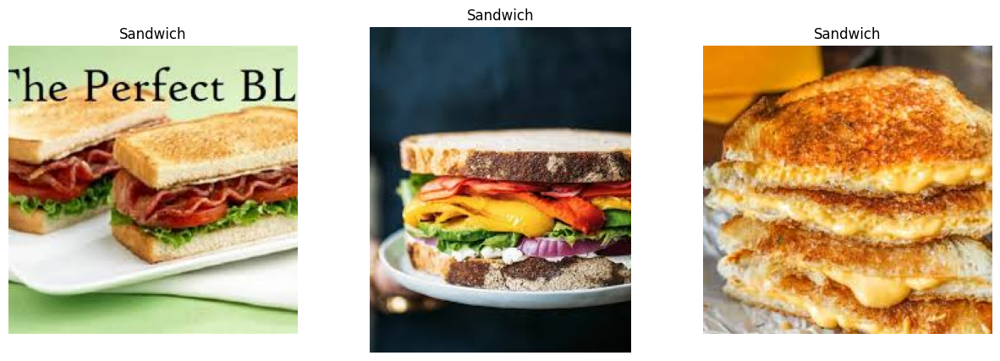

Class: Taco


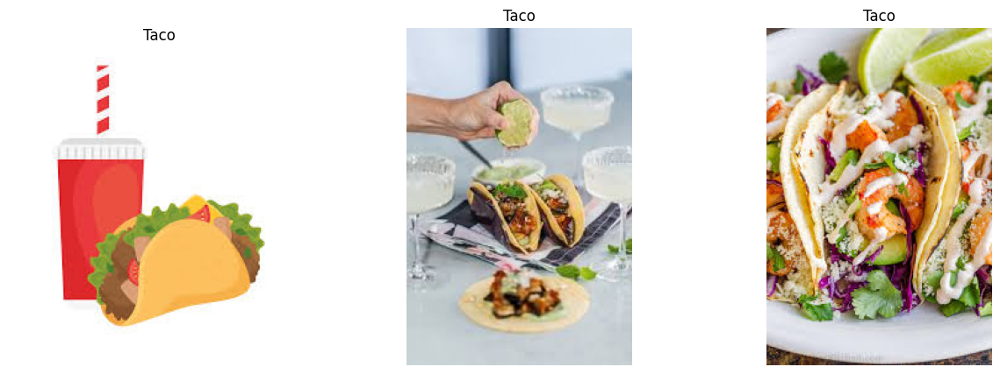

Class: Hot Dog


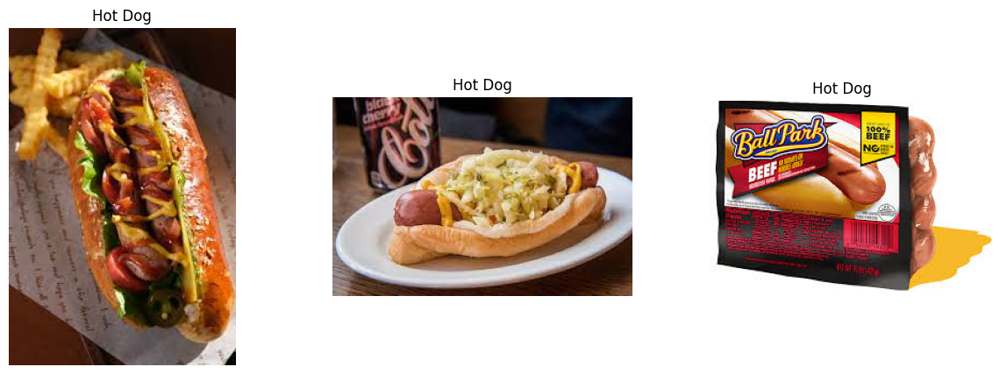

Class: Pizza


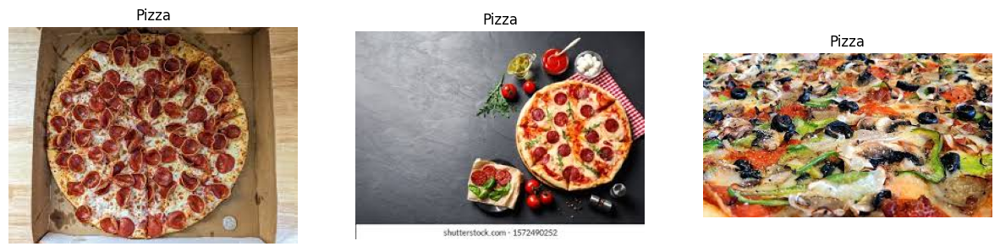

Class: Fries


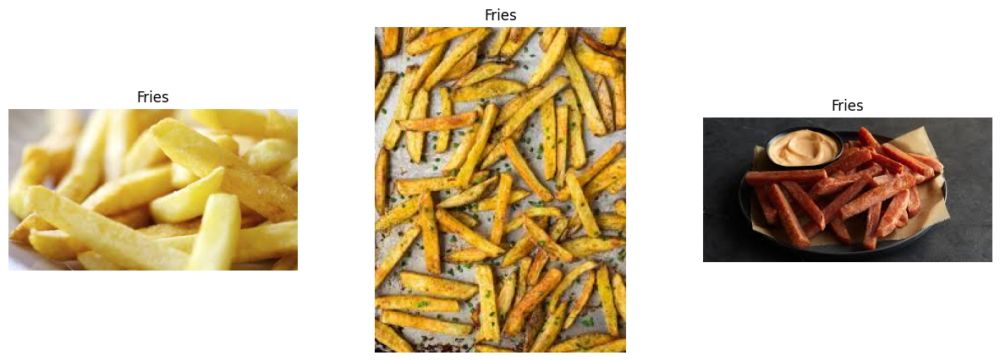

Class: Taquito


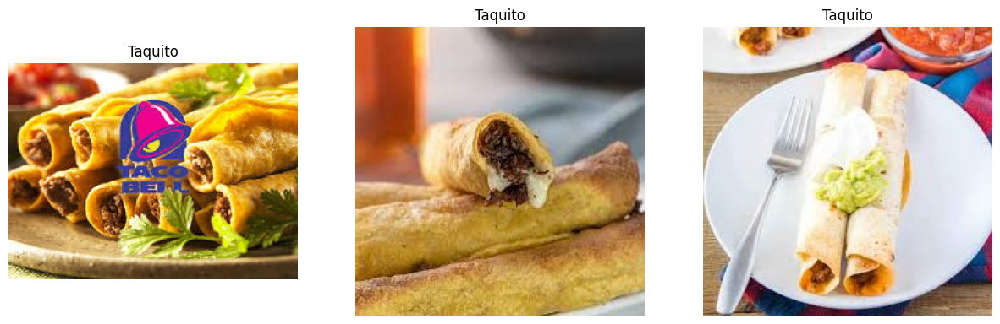

Class: Crispy Chicken


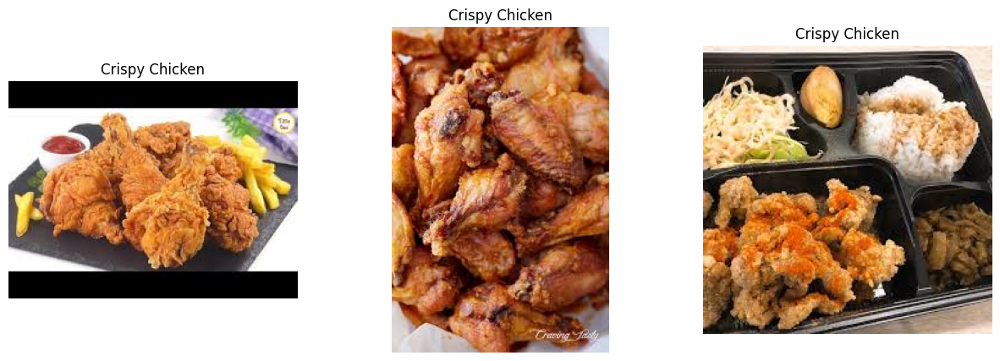

Class: Burger


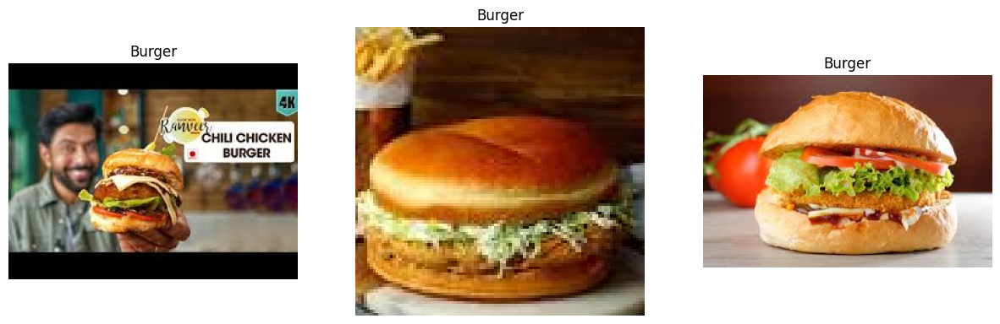

Class: Donut


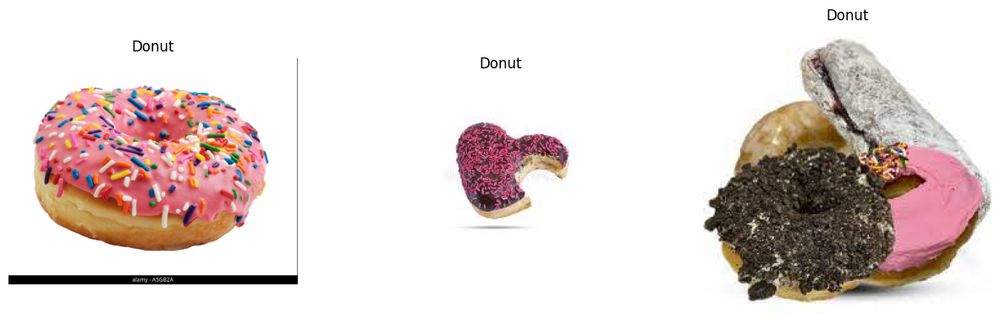

Class: Baked Potato


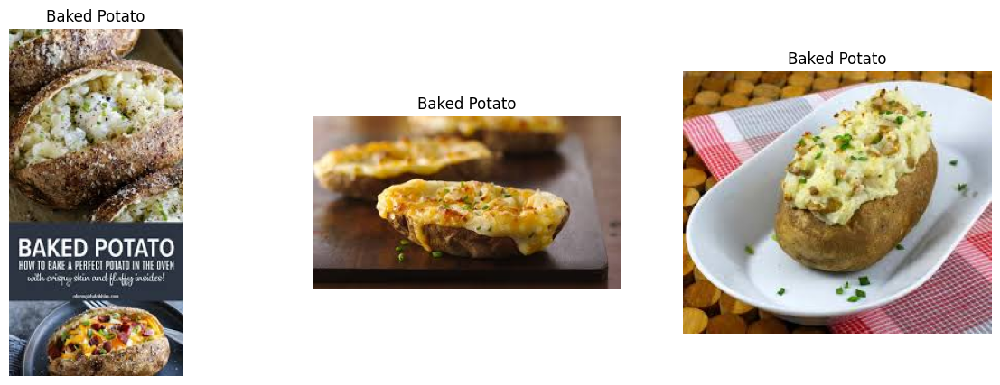

In [12]:
def visualize_random_images_from_class(class_directory_path, num_images=3):
    """
    Visualizes random images from a single class directory.

    Parameters:
    - class_directory_path: Path to the directory containing images for a single class.
    - num_images: Number of random images to visualize.
    """
    # Get all image files in the class directory
    image_files = [file for file in os.listdir(class_directory_path) if file.endswith(('jpg', 'jpeg', 'png'))]
    if len(image_files) == 0:
        print(f"No images found in: {class_directory_path}")
        return

    # Randomly sample images
    random_images = random.sample(image_files, min(len(image_files), num_images))

    # Extract class name from the directory path
    class_name = os.path.basename(class_directory_path)

    # Plot the images
    print(f"Class: {class_name}")
    fig, axes = plt.subplots(1, len(random_images), figsize=(15, 5))
    if len(random_images) == 1:
        axes = [axes]  # Ensure it's iterable for single image case

    for img_file, ax in zip(random_images, axes):
        img_path = os.path.join(class_directory_path, img_file)
        img = imread(img_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(class_name)

    plt.show()
    plt.close()

# Main directory for training data
TRAINING_DIR = "fastfood/Train"

# Get all class directories
class_directory_paths = [os.path.join(TRAINING_DIR, class_dir) for class_dir in os.listdir(TRAINING_DIR) if os.path.isdir(os.path.join(TRAINING_DIR, class_dir))]

# Loop through each class directory and visualize images
for class_directory_path in class_directory_paths:
    visualize_random_images_from_class(class_directory_path)

Class: Sandwich


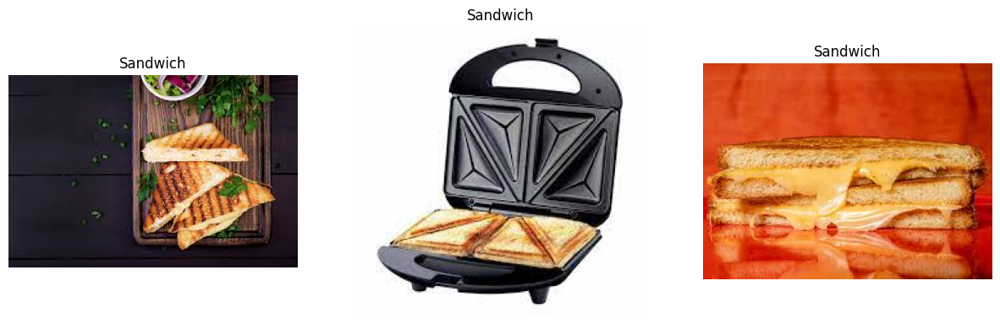

Class: Taco


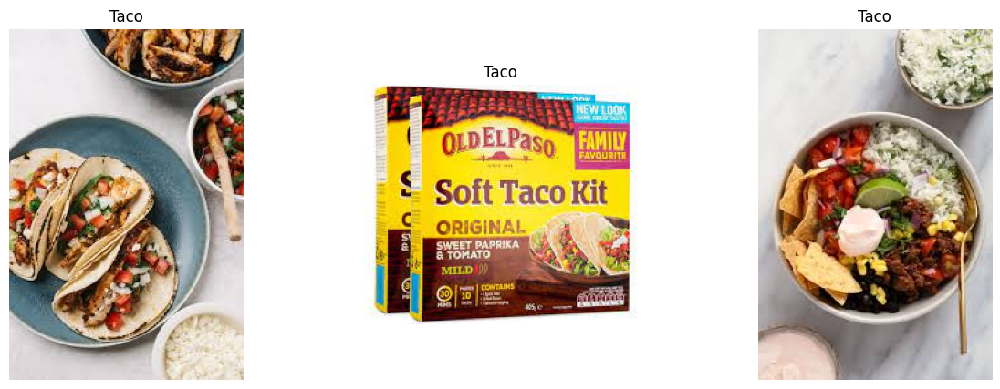

Class: Hot Dog


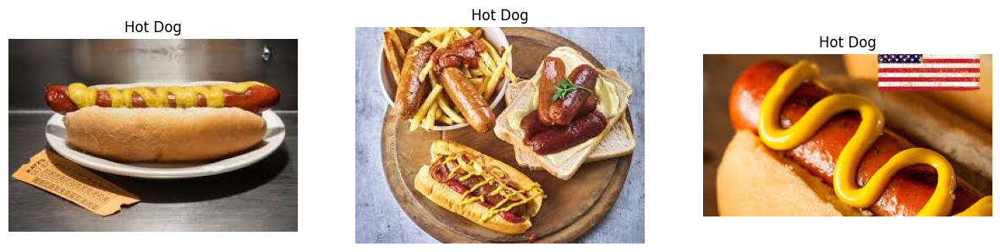

Class: Pizza


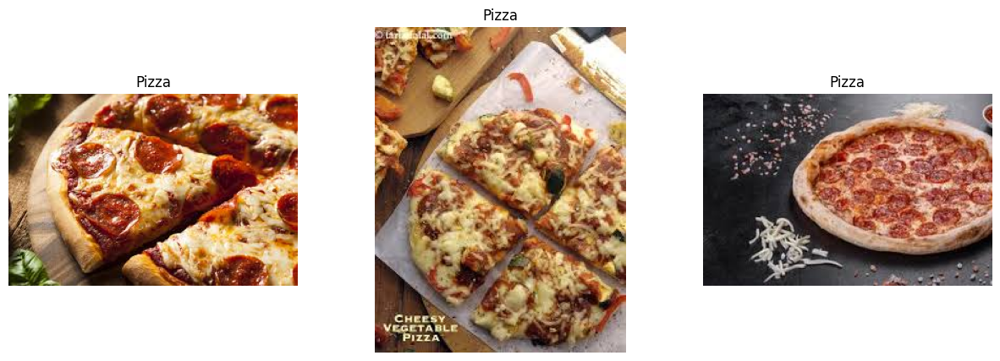

Class: Fries


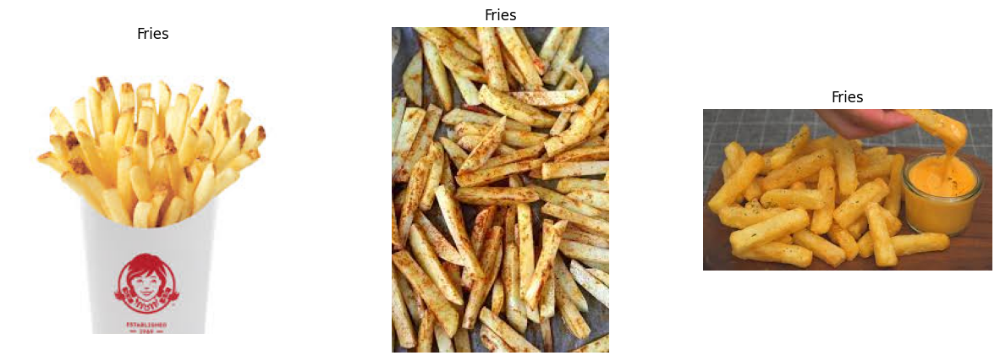

Class: Taquito


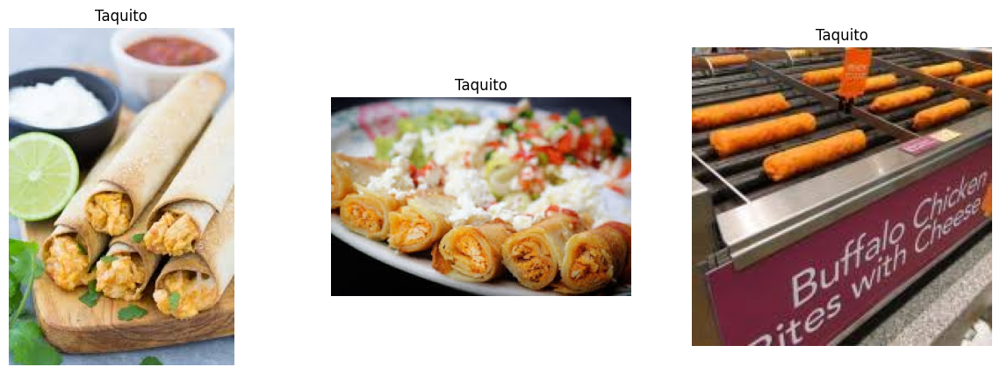

Class: Crispy Chicken


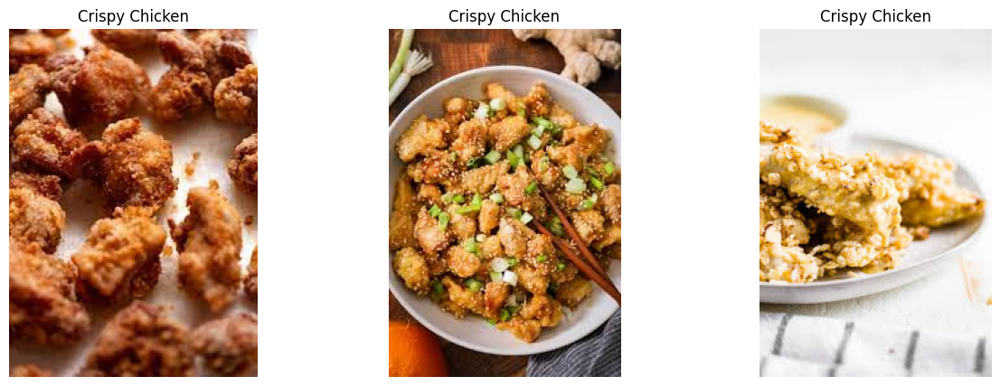

Class: Burger


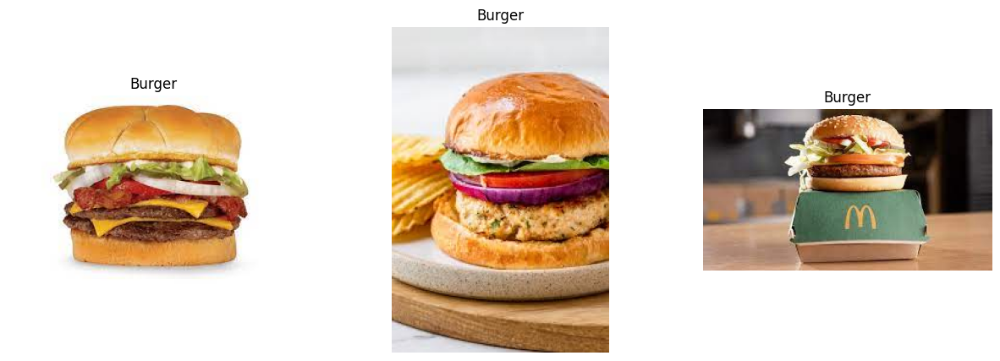

Class: Donut


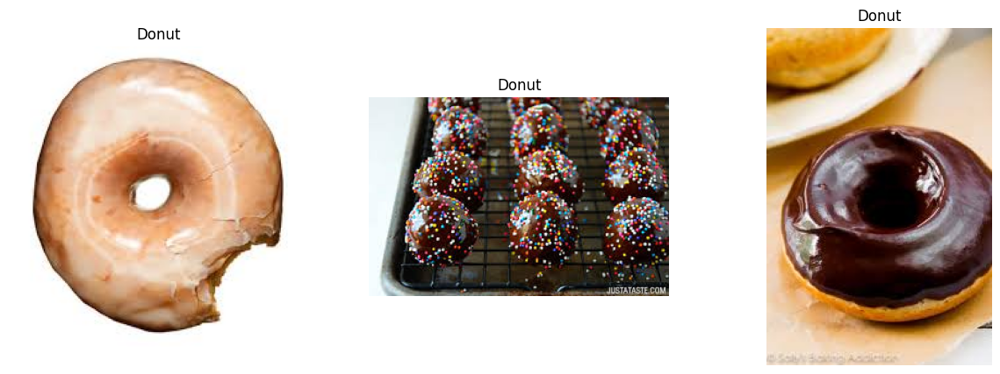

Class: Baked Potato


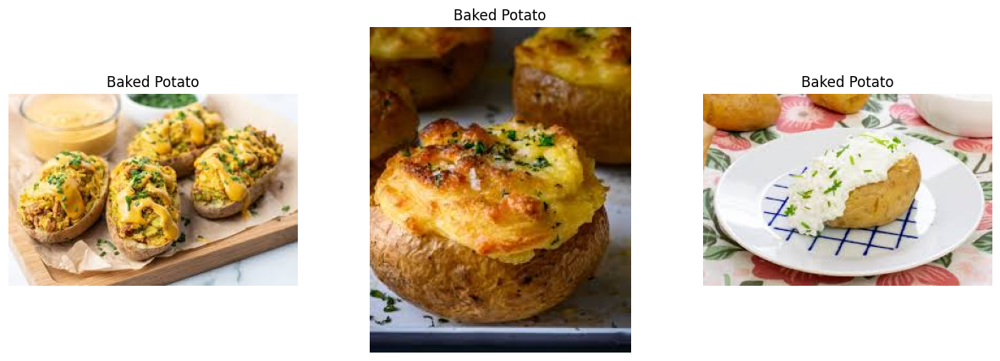

In [13]:
# Loop through each class directory and visualize images
for class_directory_path in class_directory_paths:
    visualize_random_images_from_class(class_directory_path)

In [12]:
for class_directory_path in class_directory_paths:
  visualize_random_images(TRAINING_DIR + "/" + class_directory_path)

# Task 4

1. Choose an appropriate image size for the input images for an image classification task and set the values of the predefined constants `IMAGE_HEIGHT` and `IMAGE_WIDTH`.

2. Load the training, validation and test datasets using the `image_dataset_from_directory` function shown in the Coursera course. Specifically, set appropriate values for `label_mode`, `batch_size`, `image_size` and `shuffle`. Each dataset should get a fixed `seed` of `123`.
Checkout the documentation for details:
https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image_dataset_from_directory

3. Briefly explain for which of the training, validation and test datasets might be important to shuffle the data and why this is important.

In [16]:
import tensorflow as tf
import matplotlib.pyplot as plt

In [17]:
BATCH_SIZE = 64
IMAGE_HEIGHT = 128
IMAGE_WIDTH = 128
SEED = 123

In [18]:
train_images = tf.keras.utils.image_dataset_from_directory(
    TRAINING_DIR,
    label_mode='categorical',  # Options: 'int', 'categorical', or None
    batch_size=BATCH_SIZE,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    shuffle=True,
    seed=SEED) #

validation_images = tf.keras.utils.image_dataset_from_directory(
    VALIDATION_DIR,
    label_mode='categorical',
    batch_size=BATCH_SIZE,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    shuffle=True,
    seed=SEED
)

test_images = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    label_mode='categorical',
    batch_size=BATCH_SIZE,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    shuffle=False,  # Test dataset typically not shuffled
    seed=SEED
)


Found 14999 files belonging to 10 classes.
Found 3500 files belonging to 10 classes.
Found 1500 files belonging to 10 classes.


**Expected output:**  
Found 14999 images belonging to 10 classes.  
Found 3500 images belonging to 10 classes.  
Found 1500 images belonging to 10 classes.  

# Task 5

In this exercise you will be given a predefined model architecture (except for the data augmentation layers) that you should train using the data with and without the application of data augmentation and compare the results of the different models.

1. Train the model without data augmentation for at least 30 epochs. Save a screenshot of the resulting accuracy and loss plots and judge the quality of the model. Also note the loss and accuracy of the model on the test set.

2. Train the model again, this time using data augmentation for the same number of epochs as the previous model. Choose 2 to 3 data augmentation techniques (other than rescaling) that might be suitable for the given dataset, and briefly explain why. Compare the training and model quality of the two models.

Take a look at this tutorial for an overview of (some) data augmentation techniques:
https://www.tensorflow.org/tutorials/images/data_augmentation

In [20]:
# TODO: Add data augmentation layers
data_augmentation_layers = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),  # Randomly flip images
    tf.keras.layers.RandomRotation(0.2),  # Randomly rotate images by up to 20%
    tf.keras.layers.RandomZoom(0.2),  # Randomly zoom in on images
    tf.keras.layers.RandomContrast(0.2)  # Adjust contrast by a random factor
])

In [21]:
model = tf.keras.Sequential([
    tf.keras.layers.Input((IMAGE_HEIGHT, IMAGE_WIDTH, 3)),
    tf.keras.layers.Rescaling(1/255),
    # data_augmentation_layers,
    tf.keras.layers.Conv2D(64, (3, 3), activation="relu"),
    tf.keras.layers.MaxPool2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation="relu"),
    tf.keras.layers.MaxPool2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(10, activation="softmax"),
])

In [22]:
model.compile(optimizer="adam",
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])

history = model.fit(train_images,
                    validation_data=validation_images,
                    epochs=30)

Epoch 1/30
235/235 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - accuracy: 0.1611 - loss: 2.3519 - val_accuracy: 0.3160 - val_loss: 1.9859
Epoch 2/30
235/235 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.3733 - loss: 1.8296 - val_accuracy: 0.3949 - val_loss: 1.7691
Epoch 3/30
235/235 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - accuracy: 0.5488 - loss: 1.3508 - val_accuracy: 0.4163 - val_loss: 1.9055
Epoch 4/30
235/235 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step - accuracy: 0.7271 - loss: 0.8355 - val_accuracy: 0.4489 - val_loss: 2.2800
Epoch 5/30
235/235 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - accuracy: 0.8675 - loss: 0.4317 - val_accuracy: 0.4463 - val_loss: 2.8967
Epoch 6/30
235/235 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - accuracy: 0.9347 - loss: 0.2266 - val_accuracy: 0.4337 - val_loss: 3.4449
Epoch 7/30
235/235 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - accuracy: 0.9685 - loss: 0.1193 - val_accuracy: 0.4300 - val_loss: 3.9232
Epoch 8/30
235/235 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - accuracy: 0.9704 - loss: 0.1034 - 

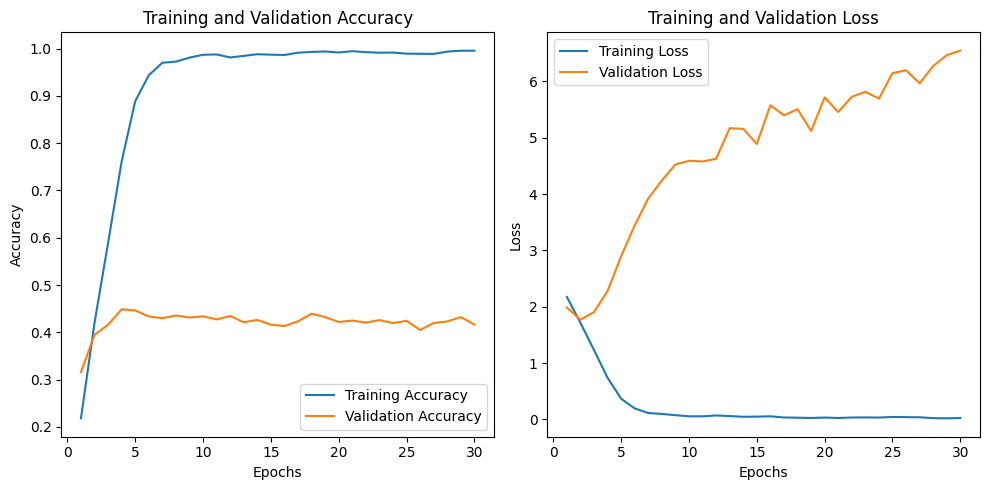

In [23]:
import matplotlib.pyplot as plt

# Plot the model training history
def plot_training_history(history):
    # Extracting accuracy and loss from the history object
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Setting up the number of epochs for the x-axis
    epochs_range = range(1, len(acc) + 1)

    # Plotting training and validation accuracy
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    # Plotting training and validation loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_history(history)

In [24]:
# Calculate loss and accuracy on the test set
test_loss, test_acc = model.evaluate(test_images)
print(f"Test Accuracy: {test_acc} | Test Loss: {test_loss}")

24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - accuracy: 0.5309 - loss: 5.2006
Test Accuracy: 0.44733333587646484 | Test Loss: 6.235480308532715
